In [4]:
import csv
import numpy as np
from matplotlib import pyplot as plt
import os
import pandas as pd
from sklearn.decomposition import PCA
import seaborn as sns

In [2]:
results_mri = "../results_0903.csv"
clinical_data = "../dataset_riemer_lastrevision_february27th.xlsx"
clinical_data_explanations = "../explanations_riemer_lastrevision_february27th.xlsx"
t1we_image_folder = "/Users/signehogstad/masterproject/T1WE_2802"

## Read file with MRI data

In [59]:
with open(results_mri) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    results = []
    for row in csv_reader:
        for i_col in range(230):
        
            results.append([])
            results[i_col].append(row[i_col])

In [60]:
df = pd.read_csv(results_mri, index_col=[0,1])
# Calculate the correlation matrix
corr = df.corr()
print(df)


                        SN CROWN_PD_MAP  SN_R CROWN_PD_MAP  SN_L CROWN_PD_MAP  \
personal_id patient_id                                                          
01-0002     0000997A            668.026         671.701887         663.880851   
01-0003     0000991B            686.626         685.528302         687.863830   
01-0004     0000DAD2            645.394         642.109434         649.097872   
01-0005     00006431            675.596         664.422642         688.195745   
01-0006     00001573            700.828         698.554717         703.391489   
...                                 ...                ...                ...   
01-0083     00005018            643.812         631.237736         657.991489   
01-0084     0000EB2F            675.618         669.354717         682.680851   
01-0085     0000C788            620.366         609.747170         632.340426   
01-0090     00008E89            692.468         694.641509         690.017021   
01-0091     0000AF0D        

<AxesSubplot:>

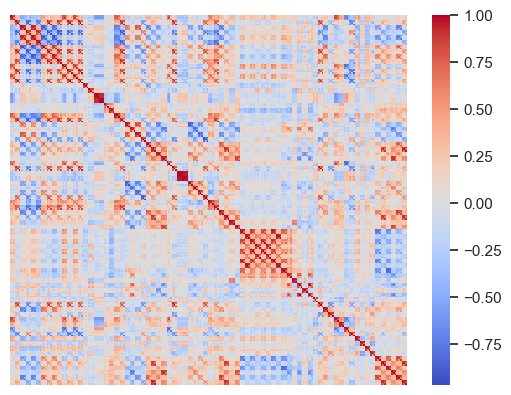

In [61]:
sns.heatmap(corr, cmap='coolwarm', xticklabels=False, yticklabels=False)

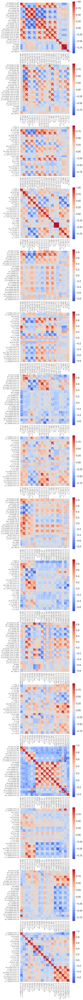

In [62]:
# Divide the correlation matrix into 16 subplots
f, ax = plt.subplots(16, figsize=(10, 160))

# Plot the heatmaps in the subplots
sns.set(font_scale=2)
sns.heatmap(corr.iloc[:57,:57], ax=ax[0], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[:57,57:114], ax=ax[1], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[57:114,:57], ax=ax[2], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[57:114,57:114], ax=ax[3], cmap='coolwarm', square=True)

sns.heatmap(corr.iloc[114:171,:57], ax=ax[4], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[171:,:57], ax=ax[5], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[114:171,57:114], ax=ax[6], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[171:,57:114], ax=ax[7], cmap='coolwarm', square=True)

sns.heatmap(corr.iloc[:57,114:171], ax=ax[8], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[57:114,114:171], ax=ax[9], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[:57,171:], ax=ax[10], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[57:114,171:], ax=ax[11], cmap='coolwarm', square=True)

sns.heatmap(corr.iloc[114:171,114:171], ax=ax[12], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[171:,114:171], ax=ax[13], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[114:171,171:], ax=ax[14], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[171:,171:], ax=ax[15], cmap='coolwarm', square=True)

# Show the plot
plt.show()


In [63]:
print(df.shape)

# Feature matrix
X = df.values
print(X)

(76, 228)
[[668.026    671.701887 663.880851 ... 194.482143 181.614286 207.35    ]
 [686.626    685.528302 687.86383  ... 209.310714 209.642857 208.978571]
 [645.394    642.109434 649.097872 ... 235.475    234.142857 236.807143]
 ...
 [620.366    609.74717  632.340426 ... 199.289286 195.435714 203.142857]
 [692.468    694.641509 690.017021 ... 220.282143 213.164286 227.4     ]
 [604.888    609.611321 599.561702 ... 225.364286 225.842857 224.885714]]


In [64]:
print(df.index)

MultiIndex([('01-0002', '0000997A'),
            ('01-0003', '0000991B'),
            ('01-0004', '0000DAD2'),
            ('01-0005', '00006431'),
            ('01-0006', '00001573'),
            ('01-0007', '0000F8F8'),
            ('01-0008', '0000CC09'),
            ('01-0009', '00003848'),
            ('01-0010', '0000565C'),
            ('01-0011', '00000A67'),
            ('01-0012', '00004510'),
            ('01-0013', '0000EF8B'),
            ('01-0014', '00004E2A'),
            ('01-0015', '00005316'),
            ('01-0016', '0000F262'),
            ('01-0017', '0000D2D0'),
            ('01-0018', '000037D3'),
            ('01-0019', '00007CE3'),
            ('01-0020', '0000F810'),
            ('01-0021', '000038BE'),
            ('01-0022', '0000F633'),
            ('01-0023', '00000172'),
            ('01-0024', '0000AA56'),
            ('01-0025', '000090DC'),
            ('01-0026', '0000C65E'),
            ('01-0027', '000096EB'),
            ('01-0029', '0000868E'),
 

### Standardise

In [65]:
from sklearn.preprocessing import StandardScaler

# Create the object
scaler = StandardScaler()
# Calculate the mean and standard deviation
scaler.fit(X)
# Transform the values
X_scaled = scaler.transform(X)

### Choose the right number of dimensions

In [66]:
from sklearn.decomposition import PCA 

pca_228 = PCA(n_components=None, random_state=2020)
pca_228.fit(X_scaled)
X_pca_228 = pca_228.transform(X_scaled)
print("Variance explained by all principal components: ")
print(sum(pca_228.explained_variance_ratio_ * 100))

Variance explained by all principal components: 
99.99999999999996


In [67]:
pca_228.explained_variance_ratio_ * 100

array([1.92668080e+01, 1.27844507e+01, 1.04702403e+01, 7.81999996e+00,
       6.46813312e+00, 5.24964128e+00, 4.28975309e+00, 3.85102582e+00,
       3.29575231e+00, 2.63172172e+00, 2.59152930e+00, 2.23648544e+00,
       1.89692242e+00, 1.62244169e+00, 1.45839092e+00, 1.36156137e+00,
       1.24740986e+00, 1.14105814e+00, 9.47850824e-01, 9.02233748e-01,
       8.45919450e-01, 7.30659333e-01, 6.21556149e-01, 5.72725667e-01,
       5.08411527e-01, 4.86822159e-01, 4.48419666e-01, 3.96478552e-01,
       3.66859095e-01, 3.38555845e-01, 2.92777687e-01, 2.53624582e-01,
       2.30262394e-01, 2.21563065e-01, 2.13604101e-01, 1.67246451e-01,
       1.63209972e-01, 1.46737514e-01, 1.38580979e-01, 1.24530935e-01,
       1.16111746e-01, 1.04477473e-01, 9.96996139e-02, 9.13916811e-02,
       7.76862337e-02, 7.24843243e-02, 6.61191518e-02, 5.91883488e-02,
       5.11573566e-02, 4.82199879e-02, 4.30084147e-02, 4.13655115e-02,
       3.82840782e-02, 3.32708881e-02, 3.10554781e-02, 2.50522908e-02,
      

In [68]:
# Cumulative explained variance [%]
np.cumsum (pca_228.explained_variance_ratio_ * 100)

array([ 19.26680804,  32.05125873,  42.52149901,  50.34149897,
        56.80963209,  62.05927337,  66.34902646,  70.20005228,
        73.49580459,  76.1275263 ,  78.71905561,  80.95554105,
        82.85246347,  84.47490516,  85.93329608,  87.29485745,
        88.54226731,  89.68332545,  90.63117628,  91.53341003,
        92.37932948,  93.10998881,  93.73154496,  94.30427063,
        94.81268215,  95.29950431,  95.74792398,  96.14440253,
        96.51126162,  96.84981747,  97.14259516,  97.39621974,
        97.62648213,  97.8480452 ,  98.0616493 ,  98.22889575,
        98.39210572,  98.53884323,  98.67742421,  98.80195515,
        98.91806689,  99.02254437,  99.12224398,  99.21363566,
        99.2913219 ,  99.36380622,  99.42992537,  99.48911372,
        99.54027108,  99.58849107,  99.63149948,  99.67286499,
        99.71114907,  99.74441996,  99.77547544,  99.80052773,
        99.8245998 ,  99.84745061,  99.86786903,  99.88524546,
        99.90253059,  99.91678981,  99.92865769,  99.93

Text(0, 0.5, 'Explained variance')

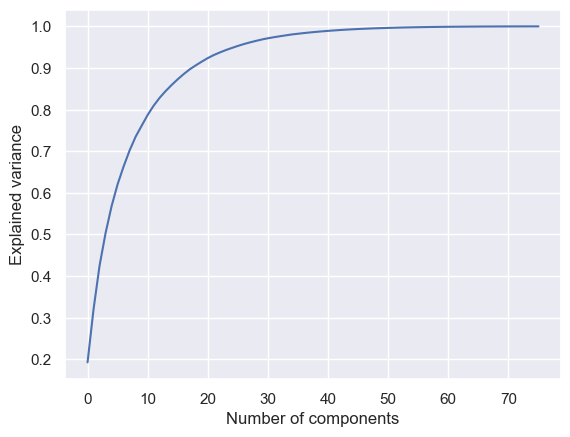

In [69]:
sns.set(font_scale=1)
plt.plot(np.cumsum(pca_228.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

### Apply PCA by setting n_components=2

In [70]:
pca_2 = PCA(n_components=2, random_state=2020)
pca_2.fit(X_scaled)
X_pca_2 = pca_2.transform(X_scaled)

Text(0, 0.5, 'Second principal component')

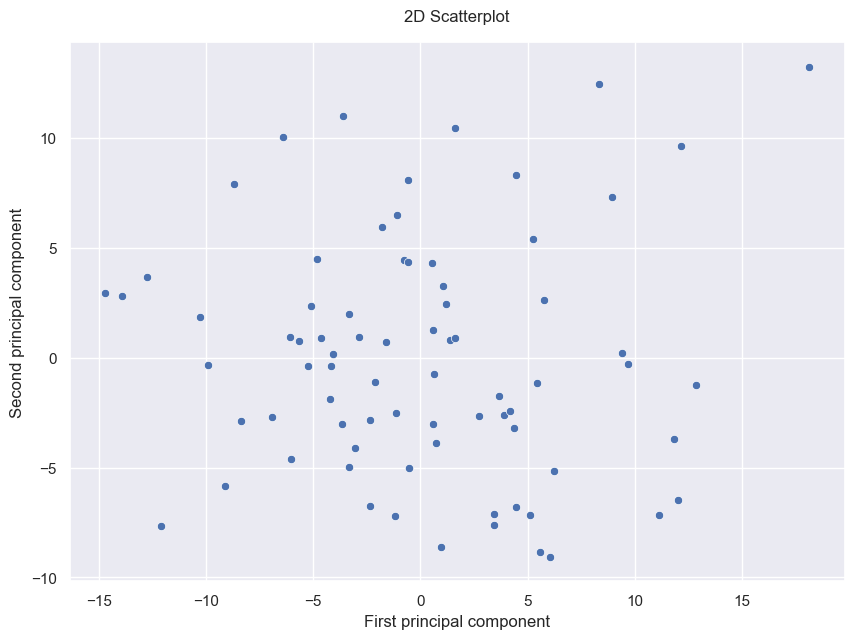

In [71]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca_2[:, 0], y=X_pca_2[:, 1])
plt.title("2D Scatterplot", pad=15)
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

### Apply PCA by setting n_components=3

In [72]:
pca_3 = PCA(n_components=3, random_state=2020)
pca_3.fit(X_scaled)
X_pca_3 = pca_3.transform(X_scaled)

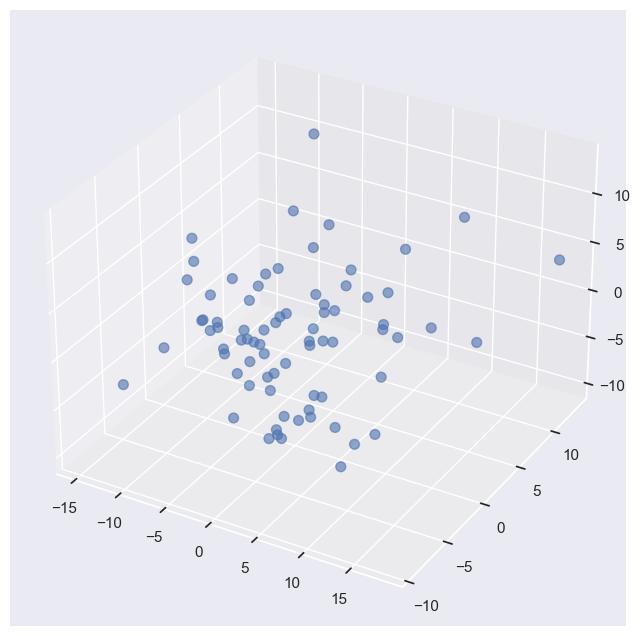

In [73]:
from mpl_toolkits import mplot3d

fig = plt.figure(figsize = (12, 8))
ax = plt.axes (projection='3d')
sctt = ax.scatter3D(X_pca_3[:, 0], X_pca_3[:, 1], X_pca_3[:, 2], s=50, alpha=0.6)

## Read file with clinical data

In [74]:
df_clinical_explanations = pd.read_excel(clinical_data_explanations)
df_clinical_explanations.columns

Index(['id', 'id ', 'status', 'gender', 'yearofbirth', 'ageatbaseline',
       'yearofdiagnosis', 'ageatonset_diagnosis', 'ageatonset_symptoms',
       'diseaseduration', 'mdsupdrsI', 'mdsupdrsII', 'mdsupdrsIIIcalc',
       'mdsupdrsIV', 'mdsupdrstotalcalc', 'tdpigdphenotype', 'hoehnyahr',
       'mdsnmstotal', 'mdsnmsnmf', 'moca', 'bsit'],
      dtype='object')

In [75]:
df_clinical = pd.read_excel(clinical_data, header=None, index_col=[0,1])
df_clinical.columns = df_clinical_explanations.columns[2:]
df_clinical.head()

,,status,gender,yearofbirth,ageatbaseline,yearofdiagnosis,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,tdpigdphenotype,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
0,1,,,,,,,,,,,,,,,,,,,
01-0002,01-0002,control,female,1954,67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.0,11.0
01-0003,01-0003,patient,female,1959,62,2017.0,58.0,57.0,50.0,12.0,4.0,13.0,7.0,36.0,td,2.0,NaN,NaN,25.0,7.0
01-0004,01-0004,control,male,1957,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0,10.0
01-0005,01-0005,patient,female,1952,68,2016.0,64.0,61.0,84.0,4.0,9.0,28.0,1.0,42.0,pigd,3.0,NaN,NaN,27.0,6.0
01-0006,01-0006,patient,female,1960,61,2017.0,57.0,58.0,36.0,6.0,3.0,29.0,0.0,38.0,td,2.0,NaN,NaN,27.0,5.0


In [76]:
df_clinical.shape

(76, 19)

In [77]:
df_clinical.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 76 entries, ('01-0002', '01-0002') to ('01-0091', '01-0091')
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   status                76 non-null     object 
 1   gender                76 non-null     object 
 2   yearofbirth           76 non-null     int64  
 3   ageatbaseline         76 non-null     int64  
 4   yearofdiagnosis       36 non-null     float64
 5   ageatonset_diagnosis  36 non-null     float64
 6   ageatonset_symptoms   52 non-null     float64
 7   diseaseduration       52 non-null     float64
 8   mdsupdrsI             51 non-null     float64
 9   mdsupdrsII            51 non-null     float64
 10  mdsupdrsIIIcalc       54 non-null     float64
 11  mdsupdrsIV            53 non-null     float64
 12  mdsupdrstotalcalc     49 non-null     float64
 13  tdpigdphenotype       58 non-null     object 
 14  hoehnyahr             54 non-null  

In [78]:
df_clinical.describe()

,yearofbirth,ageatbaseline,yearofdiagnosis,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
count,76.000000,76.000000,36.000000,36.000000,52.000000,52.000000,51.000000,51.000000,54.000000,53.000000,49.000000,54.000000,50.000000,50.000000,73.000000,71.000000
mean,1953.092105,67.960526,2016.361111,64.222222,62.173077,74.615385,8.941176,8.549020,26.111111,2.245283,45.061224,1.981481,53.220000,0.560000,24.589041,7.154930
std,9.402379,9.314420,3.788349,9.639535,9.030930,40.036333,4.772470,5.883243,10.778502,2.881677,16.288299,0.494908,34.857313,1.579977,3.353421,2.760165
min,1936.000000,32.000000,2002.000000,30.000000,29.000000,14.000000,2.000000,1.000000,4.000000,0.000000,12.000000,1.000000,7.000000,0.000000,15.000000,0.000000
25%,1946.000000,62.750000,2015.000000,57.750000,57.750000,47.750000,5.000000,4.000000,20.000000,0.000000,36.000000,2.000000,27.500000,0.000000,23.000000,5.000000
50%,1952.000000,68.500000,2017.000000,64.000000,61.500000,69.000000,7.000000,7.000000,25.000000,1.000000,41.000000,2.000000,48.500000,0.000000,25.000000,7.000000
75%,1959.000000,75.250000,2019.000000,72.000000,69.000000,84.000000,12.000000,12.000000,30.000000,4.000000,56.000000,2.000000,64.750000,0.000000,27.000000,9.500000
max,1989.000000,84.000000,2020.000000,79.000000,77.000000,228.000000,23.000000,24.000000,57.000000,9.000000,90.000000,3.000000,181.000000,6.000000,31.000000,11.000000


In [79]:
df_clinical.isnull().sum()

status                   0
gender                   0
yearofbirth              0
ageatbaseline            0
yearofdiagnosis         40
ageatonset_diagnosis    40
ageatonset_symptoms     24
diseaseduration         24
mdsupdrsI               25
mdsupdrsII              25
mdsupdrsIIIcalc         22
mdsupdrsIV              23
mdsupdrstotalcalc       27
tdpigdphenotype         18
hoehnyahr               22
mdsnmstotal             26
mdsnmsnmf               26
moca                     3
bsit                     5
dtype: int64

In [80]:
# Feature matrix
X = df_clinical.values
print(X)

[['control' 'female' 1954 ... nan 28.0 11.0]
 ['patient' 'female' 1959 ... nan 25.0 7.0]
 ['control' 'male' 1957 ... nan 27.0 10.0]
 ...
 ['patient' 'male' 1950 ... nan nan nan]
 ['patient' 'male' 1962 ... nan nan nan]
 ['patient' 'female' 1951 ... nan nan nan]]


### Handle categorical values

In [81]:
for participant in X:
    if participant[0] == "control":
        participant[0] = 0
    else:
        participant[0] = 1

    if participant[1] == "female":
        participant[1] = 0
    else:
        participant[1] = 1

    if participant[13] == "td":
        participant[13] = 0
    elif participant[13] == "pigd":
        participant[13] = 1
    elif participant[13] == "indeterminate":
        participant[13] = 2
        
print(X)
new_df_clinical = pd.DataFrame(X)
new_df_clinical.head()

[[0 0 1954 ... nan 28.0 11.0]
 [1 0 1959 ... nan 25.0 7.0]
 [0 1 1957 ... nan 27.0 10.0]
 ...
 [1 1 1950 ... nan nan nan]
 [1 1 1962 ... nan nan nan]
 [1 0 1951 ... nan nan nan]]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,0,0,1954,67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.0,11.0
1,1,0,1959,62,2017.0,58.0,57.0,50.0,12.0,4.0,13.0,7.0,36.0,0,2.0,NaN,NaN,25.0,7.0
2,0,1,1957,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0,10.0
3,1,0,1952,68,2016.0,64.0,61.0,84.0,4.0,9.0,28.0,1.0,42.0,1,3.0,NaN,NaN,27.0,6.0
4,1,0,1960,61,2017.0,57.0,58.0,36.0,6.0,3.0,29.0,0.0,38.0,0,2.0,NaN,NaN,27.0,5.0


### Handle missing values

In [82]:
from sklearn.impute import SimpleImputer

imp_mean = SimpleImputer(missing_values=np.nan, strategy='constant')
X = imp_mean.fit_transform(X)
new_df_clinical = pd.DataFrame(X)
new_df_clinical.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,0,0,1954,67,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,28.0,11.0
1,1,0,1959,62,2017.0,58.0,57.0,50.0,12.0,4.0,13.0,7.0,36.0,0,2.0,missing_value,missing_value,25.0,7.0
2,0,1,1957,63,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,27.0,10.0
3,1,0,1952,68,2016.0,64.0,61.0,84.0,4.0,9.0,28.0,1.0,42.0,1,3.0,missing_value,missing_value,27.0,6.0
4,1,0,1960,61,2017.0,57.0,58.0,36.0,6.0,3.0,29.0,0.0,38.0,0,2.0,missing_value,missing_value,27.0,5.0


In [83]:
corr = new_df_clinical.corr()
print(new_df_clinical)
#sns.heatmap(new_df_clinical, cmap='coolwarm')

   0  1     2   3              4              5              6   \
0   0  0  1954  67  missing_value  missing_value  missing_value   
1   1  0  1959  62         2017.0           58.0           57.0   
2   0  1  1957  63  missing_value  missing_value  missing_value   
3   1  0  1952  68         2016.0           64.0           61.0   
4   1  0  1960  61         2017.0           57.0           58.0   
.. .. ..   ...  ..            ...            ...            ...   
71  1  1  1956  66  missing_value  missing_value           61.0   
72  1  1  1943  78  missing_value  missing_value  missing_value   
73  1  1  1950  72  missing_value  missing_value  missing_value   
74  1  1  1962  60  missing_value  missing_value  missing_value   
75  1  0  1951  71  missing_value  missing_value  missing_value   

               7              8              9              10             11  \
0   missing_value  missing_value  missing_value  missing_value  missing_value   
1            50.0           12.0 

In [84]:
# Create the object
scaler = StandardScaler()
# Calculate the mean and standard deviation
scaler.fit(X)
# Transform the values
X_scaled = scaler.transform(X)

pca = PCA(n_components=None, random_state=2020)
pca.fit(X_scaled)
X_pca = pca.transform(X_scaled)
print("Variance explained by all principal components: ")
print(sum(pca.explained_variance_ratio_ * 100))

ValueError: could not convert string to float: 'missing_value'

In [ ]:
print(df.iloc[:,2])

0     control
1     patient
2     control
3     patient
4     patient
       ...   
76    control
77    control
78    patient
79    control
80    patient
Name: 2, Length: 81, dtype: object


Text(0, 0.5, 'Second principal component')

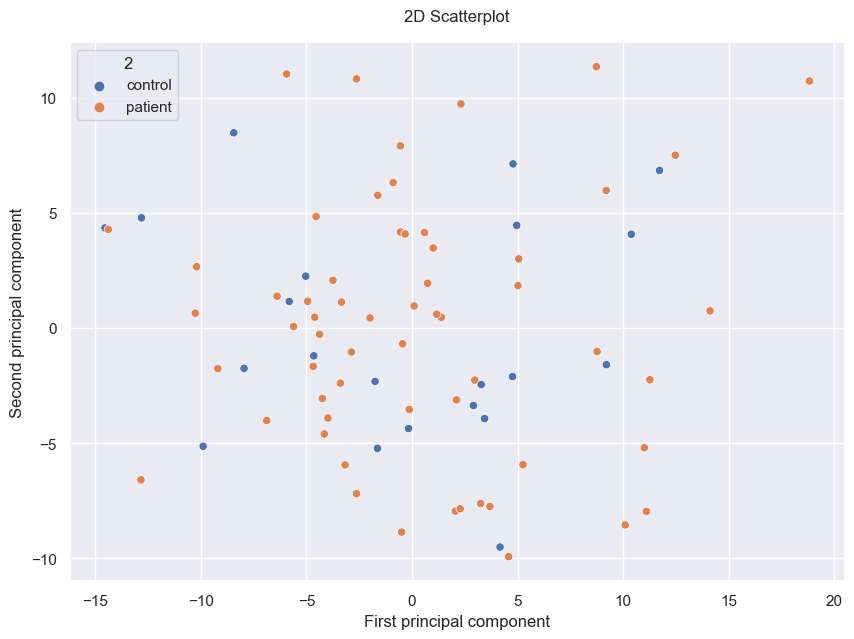

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca_2[:, 0], y=X_pca_2[:, 1], hue=df.iloc[:,2])
plt.title("2D Scatterplot", pad=15)
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

In [ ]:
c = []
for status in df.iloc[:,2]:
    if status == 'control':
        c.append('blue')
    else:
        c.append('orange')
print(c)

['blue', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'blue', 'orange', 'blue', 'orange', 'blue', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'blue', 'orange', 'blue', 'orange', 'blue', 'orange', 'blue', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'blue', 'orange', 'blue', 'orange']


Text(0.5, 0, 'Third principal component')

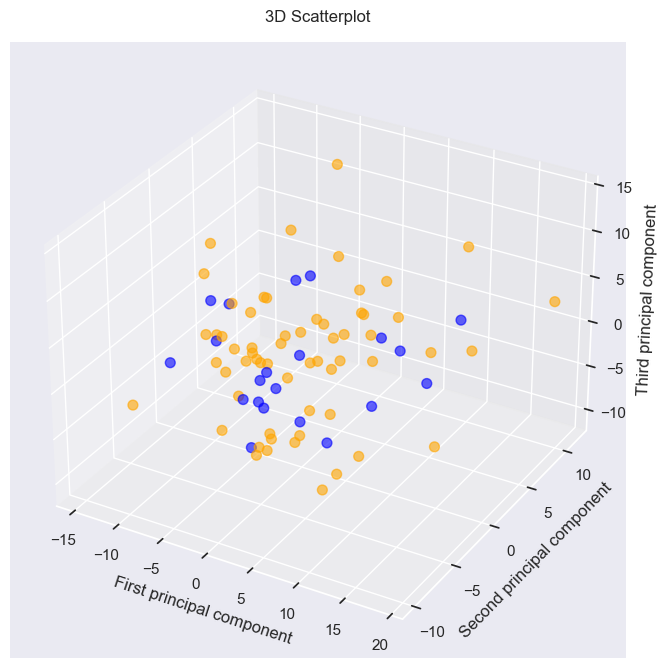

In [ ]:
from mpl_toolkits import mplot3d

fig = plt.figure(figsize = (12, 8))
ax = plt.axes (projection='3d')
sctt = ax.scatter3D(X_pca_3[:, 0], X_pca_3[:, 1], X_pca_3[:, 2], c = c, s=50, alpha=0.6)
plt.title("3D Scatterplot", pad=15)
ax.set_xlabel("First principal component")
ax.set_ylabel("Second principal component")
ax.set_zlabel("Third principal component")

## Mean and standard deviation

In [ ]:

for i in range(228):
    print(results[i+2][0])
    values = np.asarray(results[i+2][1:], dtype=np.float32)
    mean = np.mean(values)
    print('Mean: ' + str(mean))
    std = np.std(values)
    print('Standard deviation: ' + str(std))
    print()

SN CROWN_PD_MAP
Mean: 654.56964
Standard deviation: 27.83539

SN_R CROWN_PD_MAP
Mean: 647.831
Standard deviation: 32.419106

SN_L CROWN_PD_MAP
Mean: 662.1684
Standard deviation: 29.019936

LC CROWN_PD_MAP
Mean: 714.263
Standard deviation: 46.250328

LC_R CROWN_PD_MAP
Mean: 698.2543
Standard deviation: 54.324356

LC_L CROWN_PD_MAP
Mean: 730.27167
Standard deviation: 60.198406

SN CROWN_R2S
Mean: 2583.7612
Standard deviation: 364.4968

SN_R CROWN_R2S
Mean: 2630.2466
Standard deviation: 409.62796

SN_L CROWN_R2S
Mean: 2531.3416
Standard deviation: 363.17178

LC CROWN_R2S
Mean: 1556.6854
Standard deviation: 258.86816

LC_R CROWN_R2S
Mean: 1607.5171
Standard deviation: 289.64166

LC_L CROWN_R2S
Mean: 1505.8538
Standard deviation: 299.8889

SN CROWN_R2S_A2
Mean: 3079.125
Standard deviation: 580.61725

SN_R CROWN_R2S_A2
Mean: 3123.8884
Standard deviation: 631.7358

SN_L CROWN_R2S_A2
Mean: 3028.6465
Standard deviation: 580.6006

LC CROWN_R2S_A2
Mean: 1649.9155
Standard deviation: 383.55063

LC

## Histogram

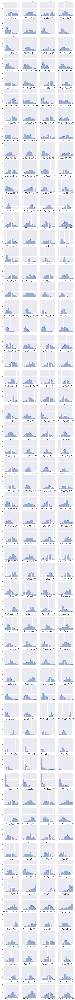

In [ ]:
fig, axes = plt.subplots(57, 4, figsize=(14,199.5), sharey=True)
for j in range(57):
    for i in range(4):
        sns.histplot(ax=axes[j,i], x=np.asarray(results[4*j+i+2][1:], dtype=np.float32), kde=True)
        axes[j,i].set_title(results[4*j+i+2][0], size=10)

## Scatter plot

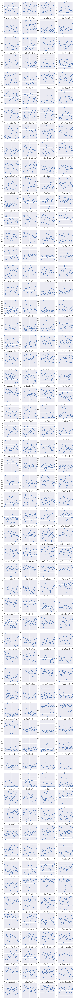

In [ ]:
sns.set(font_scale=0.9)
fig, axes = plt.subplots(57, 4, figsize=(14,199.5))
for j in range(57):
    for i in range(4):
        sns.scatterplot(ax=axes[j,i], x=np.linspace(0, len(results[4*j+i+2][1:]), len(results[4*j+i+2][1:])) ,y=np.asarray(results[4*j+i+2][1:], dtype=np.float32))
        axes[j,i].set_title(results[4*j+i+2][0], size=10)

## Segmentation of SNpc and LC on T1WE image

In [5]:
import sys
import matplotlib.image as mpimg

In [6]:
sys.path.append(t1we_image_folder)
print(sys.path[-1])

/Users/signehogstad/masterproject/T1WE_2802


(0.0, 1.0, 149.5, -0.5)

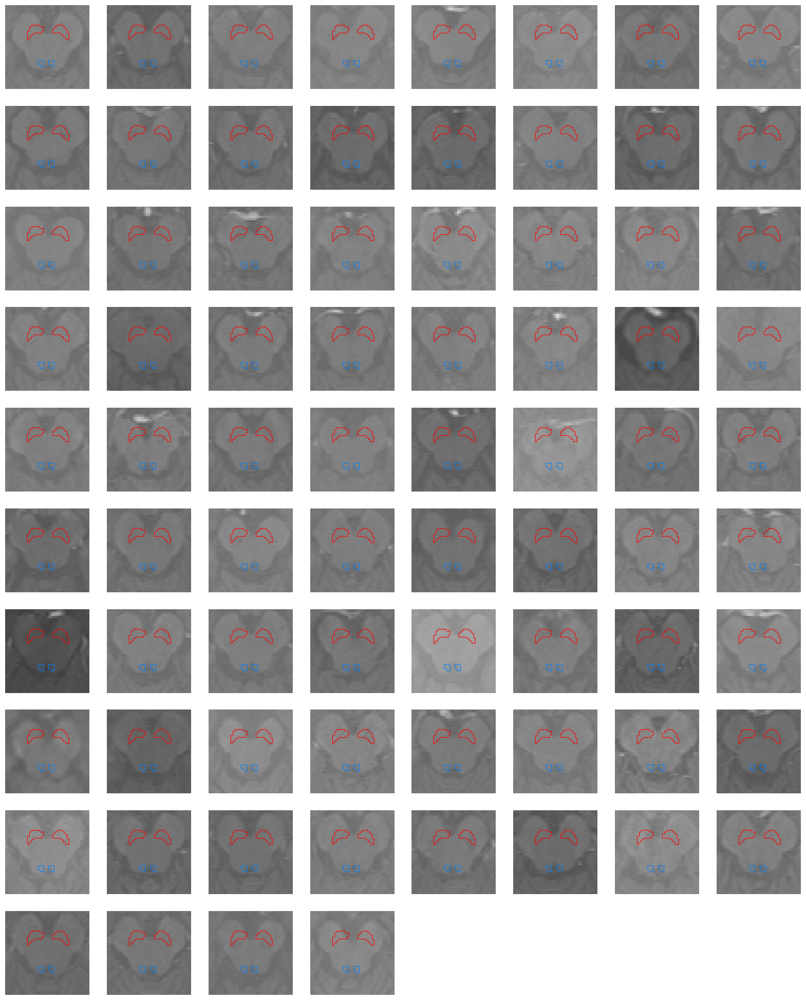

In [35]:
fig, axes = plt.subplots(10, 8, figsize=(20,25), sharey=True)
for path, directories, files in os.walk(sys.path[-1]):
    files.remove(".DS_Store")
    for file in files:
        img = mpimg.imread(t1we_image_folder + f"/{file}")
        index = files.index(file)
        j = index//8
        i = index%8
        axes[j,i].imshow(img)
        axes[j,i].axis('off')

axes[9,4].axis('off')
axes[9,5].axis('off') 
axes[9,6].axis('off')
axes[9,7].axis('off')

## Visual inspection of segmentation of SNpc and LC on T1WE image

(0.0, 1.0, 149.5, -0.5)

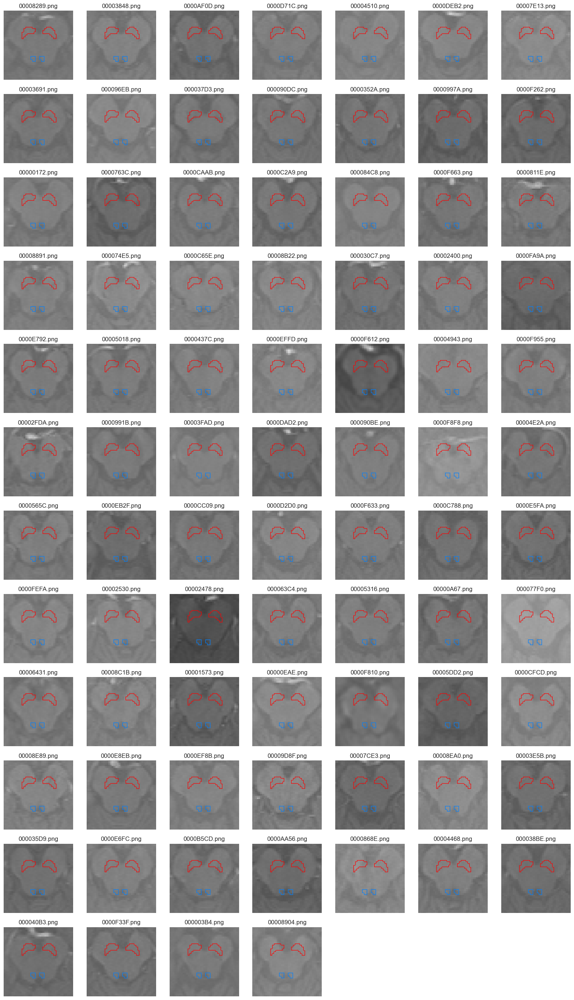

In [92]:
fig, axes = plt.subplots(12, 7, figsize=(20,35), sharey=True)
for path, directories, files in os.walk(sys.path[-1]):
    files.remove(".DS_Store")
    for file in files:
        img = mpimg.imread(t1we_image_folder + f"/{file}")
        index = files.index(file)
        j = index//7
        i = index%7
        axes[j,i].imshow(img)
        axes[j,i].axis('off')
        axes[j,i].set_title(file)
        
axes[11,4].axis('off')
axes[11,5].axis('off')
axes[11,6].axis('off')